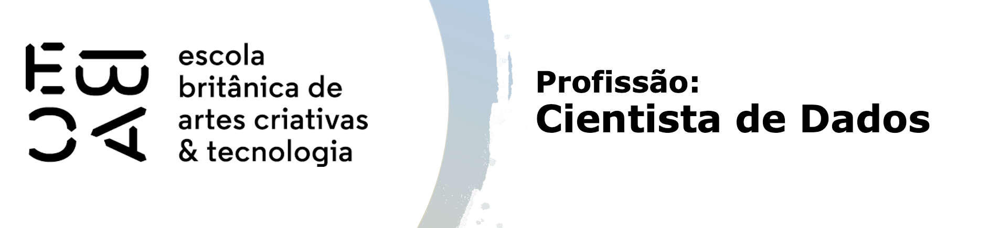

# Tarefa - Agrupamento hierárquico

Neste exercício vamos usar a base [online shoppers purchase intention](https://archive.ics.uci.edu/ml/datasets/Online+Shoppers+Purchasing+Intention+Dataset) de Sakar, C.O., Polat, S.O., Katircioglu, M. et al. Neural Comput & Applic (2018). [Web Link](https://doi.org/10.1007/s00521-018-3523-0).

A base trata de registros de 12.330 sessões de acesso a páginas, cada sessão sendo de um único usuário em um período de 12 meses, para posteriormente estudarmos a relação entre o design da página e o perfil do cliente - "Será que clientes com comportamento de navegação diferentes possuem propensão a compra diferente?" 

Nosso objetivo agora é agrupar as sessões de acesso ao portal considerando o comportamento de acesso e informações da data, como a proximidade a uma data especial, fim de semana e o mês.

|Variavel                |Descrição          | 
|------------------------|:-------------------| 
|Administrative          | Quantidade de acessos em páginas administrativas| 
|Administrative_Duration | Tempo de acesso em páginas administrativas | 
|Informational           | Quantidade de acessos em páginas informativas  | 
|Informational_Duration  | Tempo de acesso em páginas informativas  | 
|ProductRelated          | Quantidade de acessos em páginas de produtos | 
|ProductRelated_Duration | Tempo de acesso em páginas de produtos | 
|BounceRates             | *Percentual de visitantes que entram no site e saem sem acionar outros *requests* durante a sessão  | 
|ExitRates               | * Soma de vezes que a página é visualizada por último em uma sessão dividido pelo total de visualizações | 
|PageValues              | * Representa o valor médio de uma página da Web que um usuário visitou antes de concluir uma transação de comércio eletrônico | 
|SpecialDay              | Indica a proximidade a uma data festiva (dia das mães etc) | 
|Month                   | Mês  | 
|OperatingSystems        | Sistema operacional do visitante | 
|Browser                 | Browser do visitante | 
|Region                  | Região | 
|TrafficType             | Tipo de tráfego                  | 
|VisitorType             | Tipo de visitante: novo ou recorrente | 
|Weekend                 | Indica final de semana | 
|Revenue                 | Indica se houve compra ou não |

\* variávels calculadas pelo google analytics

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from ydata_profiling import ProfileReport
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from tqdm.notebook import tqdm
from sklearn.cluster import KMeans
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram
from gower import gower_matrix

%matplotlib inline

In [2]:
df = pd.read_csv('online_shoppers_intention.csv')

In [3]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [4]:
df.Revenue.value_counts(dropna=False)

False    10422
True      1908
Name: Revenue, dtype: int64

## Análise descritiva

Faça uma análise descritiva das variáveis do escopo.

- Verifique a distribuição dessas variáveis
- Veja se há valores *missing* e caso haja, decida o que fazer
- Faça mais algum tratamento nas variáveis caso ache pertinente

In [5]:
# Há registros missing?
df.isna().sum()

Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64

In [6]:
# Qual é o tipo dos dados?
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

In [7]:
prof = ProfileReport(df, explorative=True)
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
df[['Region', 'TrafficType']] = df[['Region', 'TrafficType']].astype(str)

## Variáveis de agrupamento

Liste as variáveis que você vai querer utilizar. Essa é uma atividade importante do projeto, e tipicamente não a recebemos pronta. Não há resposta pronta ou correta, mas apenas critérios e a sua decisão. Os critérios são os seguintes:

- Selecione para o agrupamento variáveis que descrevam o padrão de navegação na sessão.
- Selecione variáveis que indiquem a característica da data.
- Não se esqueça de que você vai precisar realizar um tratamento especial para variáveis qualitativas.
- Trate adequadamente valores faltantes.

In [9]:
#aqui vamos remover mais algumas variaveis em relação ao dispositivo,apesar de em alguns senarios ser uma informação relevante
# Revenue esta sendo removido pois queremos prever quem ira comprar ou não.
df = df.drop(['Browser', 'OperatingSystems','Revenue'], axis=1)

In [10]:
variaveis = list(df.columns.values)  # Converte os nomes das colunas para uma lista

# Colunas categoricas
variaveis_cat = ['Revenue', 'Weekend', 'VisitorType', 'Month','Region',
 'TrafficType']

# Criar uma nova lista excluindo as colunas categoricas
variaveis_quan = [col for col in variaveis if col not in variaveis_cat]

print(variaveis)


['Administrative', 'Administrative_Duration', 'Informational', 'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration', 'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Month', 'Region', 'TrafficType', 'VisitorType', 'Weekend']


In [11]:
variaveis_quan

['Administrative',
 'Administrative_Duration',
 'Informational',
 'Informational_Duration',
 'ProductRelated',
 'ProductRelated_Duration',
 'BounceRates',
 'ExitRates',
 'PageValues',
 'SpecialDay']

### Vamos padronizar os dados quantitativos

In [13]:
#separando od DF em qulitativo e quantativo

df_qual = df[[
              'Weekend',
              'VisitorType',
              'Month',
              'Region',
 'TrafficType']]

df_quan = df[['Administrative',
 'Administrative_Duration',
 'Informational',
 'Informational_Duration',
 'ProductRelated',
 'ProductRelated_Duration',
 'BounceRates',
 'ExitRates',
 'PageValues',
 'SpecialDay']]

In [14]:
df_quan = pd.DataFrame(StandardScaler().fit_transform(df_quan), columns = df_quan.columns)
df_quan.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay
0,-0.696993,-0.457191,-0.396478,-0.244931,-0.691003,-0.624348,3.667189,3.229316,-0.317178,-0.308821
1,-0.696993,-0.457191,-0.396478,-0.244931,-0.668518,-0.590903,-0.457683,1.171473,-0.317178,-0.308821
2,-0.696993,-0.457191,-0.396478,-0.244931,-0.691003,-0.624348,3.667189,3.229316,-0.317178,-0.308821
3,-0.696993,-0.457191,-0.396478,-0.244931,-0.668518,-0.622954,0.573535,1.994610,-0.317178,-0.308821
4,-0.696993,-0.457191,-0.396478,-0.244931,-0.488636,-0.296430,-0.045196,0.142551,-0.317178,-0.308821


In [15]:
#vamos juntos os df em um só de novo

df2 = df_quan.reset_index().merge(df_qual.reset_index(), how='left')

In [21]:

df2 = pd.get_dummies(df[variaveis].dropna())
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 53 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Administrative                 12330 non-null  int64  
 1   Administrative_Duration        12330 non-null  float64
 2   Informational                  12330 non-null  int64  
 3   Informational_Duration         12330 non-null  float64
 4   ProductRelated                 12330 non-null  int64  
 5   ProductRelated_Duration        12330 non-null  float64
 6   BounceRates                    12330 non-null  float64
 7   ExitRates                      12330 non-null  float64
 8   PageValues                     12330 non-null  float64
 9   SpecialDay                     12330 non-null  float64
 10  Weekend                        12330 non-null  bool   
 11  Month_Aug                      12330 non-null  uint8  
 12  Month_Dec                      12330 non-null 

In [18]:
df2['Weekend'] = df2['Weekend'].map({False: 0, True: 1})


In [19]:
# Seleciona apenas as colunas do tipo uint8
colunas_uint8 = df2.select_dtypes(include=['uint8']).columns

# Converte os nomes das colunas selecionadas para uma lista
variaveis_uint8 = list(colunas_uint8)

print(variaveis_uint8)

['Month_Aug', 'Month_Dec', 'Month_Feb', 'Month_Jul', 'Month_June', 'Month_Mar', 'Month_May', 'Month_Nov', 'Month_Oct', 'Month_Sep', 'Region_1', 'Region_2', 'Region_3', 'Region_4', 'Region_5', 'Region_6', 'Region_7', 'Region_8', 'Region_9', 'TrafficType_1', 'TrafficType_10', 'TrafficType_11', 'TrafficType_12', 'TrafficType_13', 'TrafficType_14', 'TrafficType_15', 'TrafficType_16', 'TrafficType_17', 'TrafficType_18', 'TrafficType_19', 'TrafficType_2', 'TrafficType_20', 'TrafficType_3', 'TrafficType_4', 'TrafficType_5', 'TrafficType_6', 'TrafficType_7', 'TrafficType_8', 'TrafficType_9', 'VisitorType_New_Visitor', 'VisitorType_Other', 'VisitorType_Returning_Visitor']


## Número de grupos

Nesta atividade vamos adotar uma abordagem bem pragmática e avaliar agrupamentos hierárquicos com 3 e 4 grupos, por estarem bem alinhados com uma expectativa e estratégia do diretor da empresa. 

*Atenção*: Cuidado se quiser fazer o dendrograma, pois com muitas observações ele pode ser mais complicado de fazer, e dependendo de como for o comando, ele pode travar o *kernell* do seu python.

In [20]:
variaveis2 = list(df2.columns.values)

In [22]:
vars_cat2 = [True if x in {'Weekend','Month_Aug', 'Month_Dec', 'Month_Feb', 'Month_Jul', 'Month_June', 'Month_Mar', 'Month_May', 'Month_Nov', 'Month_Oct', 'Month_Sep', 'Region_1', 'Region_2', 'Region_3', 'Region_4', 'Region_5', 'Region_6', 'Region_7', 'Region_8', 'Region_9', 'TrafficType_1', 'TrafficType_10', 'TrafficType_11', 'TrafficType_12', 'TrafficType_13', 'TrafficType_14', 'TrafficType_15', 'TrafficType_16', 'TrafficType_17', 'TrafficType_18', 'TrafficType_19', 'TrafficType_2', 'TrafficType_20', 'TrafficType_3', 'TrafficType_4', 'TrafficType_5', 'TrafficType_6', 'TrafficType_7', 'TrafficType_8', 'TrafficType_9', 'VisitorType_New_Visitor', 'VisitorType_Other', 'VisitorType_Returning_Visitor'} else False for x in df2.columns]

In [23]:
distancia_gower = gower_matrix(df2, cat_features=vars_cat2)

In [24]:
gdv = squareform(distancia_gower,force='tovector')

In [25]:
gdv.shape

(76008285,)

In [26]:
Z = linkage(gdv, method='complete')
Z_df = pd.DataFrame(Z,columns=['id1','id2','dist','n'])
Z_df.head()

,id1,id2,dist,n
0,0.0,182.0,0.0,2.0
1,16.0,64.0,0.0,2.0
2,85.0,158.0,0.0,2.0
3,10341.0,11801.0,0.0,2.0
4,11938.0,12333.0,0.0,3.0


Leaves = 12315


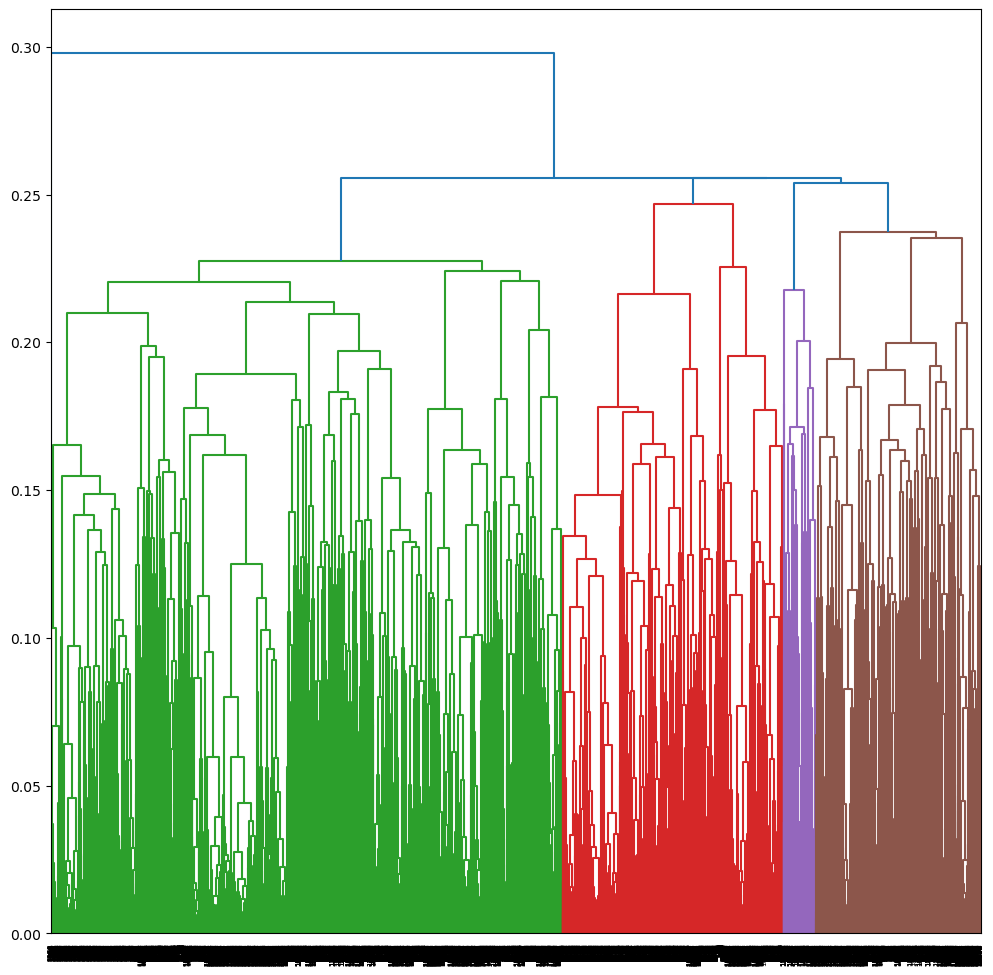

In [27]:
fig,axs = plt.subplots(1,1,figsize=(12,12))
dn = dendrogram(Z, truncate_mode='level',p=30,show_leaf_counts=True,ax=axs, color_threshold=.25)
print(f"Leaves = {len(dn['leaves'])}")

In [28]:
def calculate_sqd(X, labels):
    unique_labels = np.unique(labels)
    sqd = 0
    for label in unique_labels:
        cluster_points = X[labels == label]
        centroid = cluster_points.mean(axis=0)
        sqd += ((cluster_points - centroid) ** 2).sum()
    return sqd

In [29]:
SQD = []
K = range(1, 9)
for k in tqdm(K):
    labels = fcluster(Z, k, criterion='maxclust')
    sqd = calculate_sqd(df2.values, labels)
    SQD.append(sqd)

  0%|          | 0/8 [00:00<?, ?it/s]

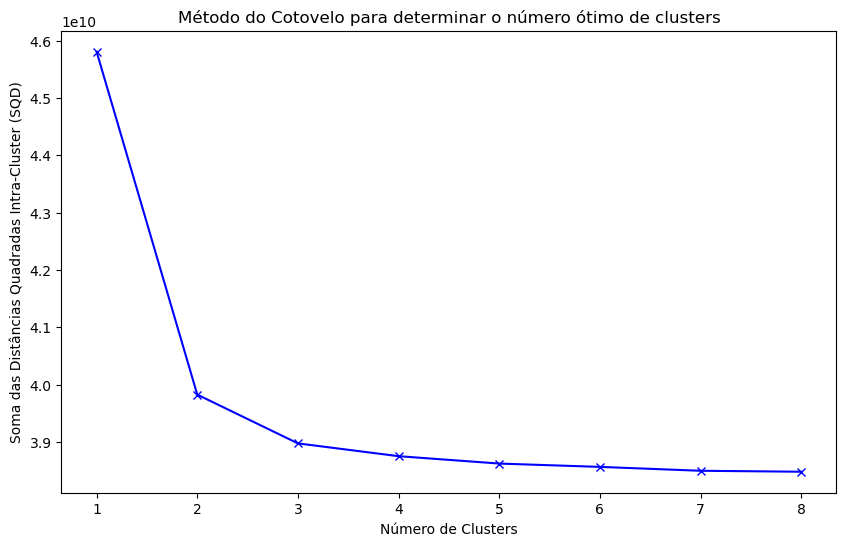

In [30]:
plt.figure(figsize=(10, 6))
plt.plot(K, SQD, 'bx-')
plt.xlabel('Número de Clusters')
plt.ylabel('Soma das Distâncias Quadradas Intra-Cluster (SQD)')
plt.title('Método do Cotovelo para determinar o número ótimo de clusters')
plt.show()

 ### Vamos realizar a aquebra em 3 e 4 grupos, como solicitado no exercício e pelo grafico do cotovelo

In [31]:
df2['grupo'] = fcluster(Z, 4, criterion='maxclust')
df2.grupo.value_counts()

2    6776
3    2932
4    2619
1       3
Name: grupo, dtype: int64

In [32]:
df2['grupo2'] = fcluster(Z, 3, criterion='maxclust')
df2.grupo2.value_counts()

2    6776
3    5551
1       3
Name: grupo2, dtype: int64

In [33]:
df2.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,...,TrafficType_5,TrafficType_6,TrafficType_7,TrafficType_8,TrafficType_9,VisitorType_New_Visitor,VisitorType_Other,VisitorType_Returning_Visitor,grupo,grupo2
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,...,0,0,0,0,0,0,0,1,3,3
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,...,0,0,0,0,0,0,0,1,3,3
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,...,0,0,0,0,0,0,0,1,3,3
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,...,0,0,0,0,0,0,0,1,2,2
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,...,0,0,0,0,0,0,0,1,2,2


## Avaliação dos grupos

Construa os agrupamentos com a técnica adequada que vimos em aula. Não se esqueça de tratar variáveis qualitativas, padronizar escalas das quantitativas, tratar valores faltantes e utilizar a distância correta.

Faça uma análise descritiva para pelo menos duas soluções de agrupamentos (duas quantidades diferentes de grupos) sugeridas no item anterior, utilizando as variáveis que estão no escopo do agrupamento.
- Com base nesta análise e nas análises anteriores, decida pelo agrupamento final. 
- Se puder, sugira nomes para os grupos.

In [34]:
df3 = df.reset_index().merge(df2[['grupo','grupo2']].reset_index(), how='left')
df3

,index,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,Region,TrafficType,VisitorType,Weekend,grupo,grupo2
0,0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,Returning_Visitor,False,3,3
1,1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,Feb,1,2,Returning_Visitor,False,3,3
2,2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,Feb,9,3,Returning_Visitor,False,3,3
3,3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,Feb,2,4,Returning_Visitor,False,2,2
4,4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,Feb,1,4,Returning_Visitor,True,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,1,1,Returning_Visitor,True,3,3
12326,12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,Nov,1,8,Returning_Visitor,True,2,2
12327,12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,Nov,1,13,Returning_Visitor,True,2,2
12328,12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,Nov,3,11,Returning_Visitor,False,2,2


In [35]:
cluster_distribution = pd.Series(df2['grupo']).value_counts()
print(cluster_distribution)

2    6776
3    2932
4    2619
1       3
Name: grupo, dtype: int64


In [36]:
from tabulate import tabulate

small_cluster = df[df3['grupo'] == cluster_distribution.idxmin()]
print(small_cluster)

      Administrative  Administrative_Duration  Informational  \
5152              17              2629.253968             24   
8071               5              3398.750000              6   
9238              15              2657.318056             13   

      Informational_Duration  ProductRelated  ProductRelated_Duration  \
5152             2050.433333             705              43171.23338   
8071             2549.375000             449              63973.52223   
9238             1949.166667             343              29970.46597   

      BounceRates  ExitRates  PageValues  SpecialDay Month Region TrafficType  \
5152     0.004851   0.015431    0.763829         0.0   May      1          14   
8071     0.000764   0.027701    0.000000         0.0   Dec      1           2   
9238     0.005316   0.028971    0.000000         0.0   Dec      1           2   

            VisitorType  Weekend  
5152  Returning_Visitor     True  
8071  Returning_Visitor    False  
9238  Returning_Visi

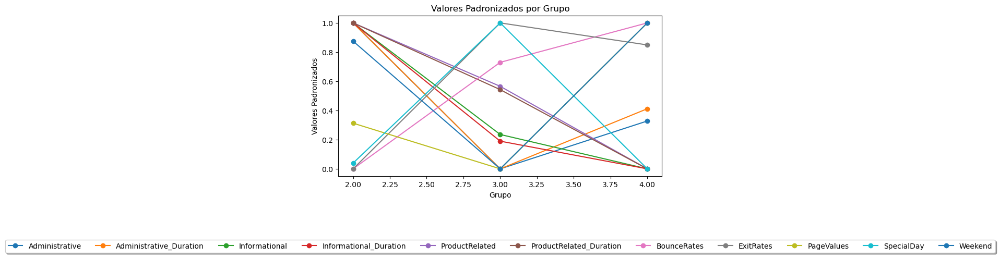

In [37]:
padroniza = lambda x: (x - x.min())/(x.max() - x.min())

# Selecionando apenas os grupos desejados (2, 3, 4)
grupos_selecionados = [2, 3, 4]
df_selecionado = df3[df3['grupo'].isin(grupos_selecionados)]

# Agrupamento pela coluna 'grupo' e cálculo da média das variáveis
grouped_mean = df_selecionado.groupby('grupo')[variaveis].mean()

# Aplicando a padronização às médias das variáveis
grouped_mean_padronizado = grouped_mean.apply(padroniza)

# Plotagem
fig, ax = plt.subplots(figsize=(8, 4))

# Plotando os dados padronizados
for variavel in grouped_mean_padronizado.columns:
    ax.plot(grouped_mean_padronizado.index, grouped_mean_padronizado[variavel], marker='o', label=variavel)

# Adicionando legenda abaixo do gráfico
ax.legend(loc='lower center', bbox_to_anchor=(0.5, -0.5), ncol=len(grouped_mean_padronizado.columns), fancybox=True, shadow=True)

# Configurações adicionais do gráfico
ax.set_xlabel('Grupo')
ax.set_ylabel('Valores Padronizados')
ax.set_title('Valores Padronizados por Grupo')

plt.show()

### Vamos ter 4 grupos no total:
 - 1. este grupo é de outliers, dentro dele estão as seções com muito tempo de produto, provavelmente algumas seções travadas.
 - 2. Este grupo é o grupo de pessoas olhandoi o site, navegando pelas paginas e pesquisando produtos e com alta chance de compra.
  - 3. Este é o grupo dos dias especiais, onde pessoas entram para procurar presentes em dias especiais, com um certo bounce rate razoável.
 - 4. Neste grupo o bouce rate é bem alto e entram mais em fim de semana mas interagem pouco com a loja. 

## Avaliação de resultados

Avalie os grupos obtidos com relação às variáveis fora do escopo da análise (minimamente *bounce rate* e *revenue*). 
- Qual grupo possui clientes mais propensos à compra?

## Revenue foi retirado para realizar a análise, como a ideia é prever quem tem mais chance de comprar não podemos utilizar o Revenue como entrada pois não saberíamos isso na hora. Sendo assim o gurpo com maior propensão a compra é o grupo 2, onde temos um baixo bouncerate, alta vizualização de produto e tempo de navegação. 
